### 1 - Import test data

In [11]:
import pandas as pd
import pandas_ta as ta

df = pd.read_csv("EURUSD_Candlestick_5_M_BID_01.02.2023-17.02.2024.csv")
df["Gmt time"]=df["Gmt time"].str.replace(".000","")
df['Gmt time']=pd.to_datetime(df['Gmt time'],format='%d.%m.%Y %H:%M:%S')
df=df[df.High!=df.Low]

In [12]:
df["EMA_slow"]=ta.ema(df.Close, length=50)
df["EMA_fast"]=ta.ema(df.Close, length=40)
df['ATR']=ta.atr(df.High, df.Low, df.Close, length=7)
df

,Gmt time,Open,High,Low,Close,Volume,EMA_slow,EMA_fast,ATR
0,2023-02-01 00:00:00,1.08605,1.08616,1.08583,1.08608,771.87,NaN,NaN,NaN
1,2023-02-01 00:05:00,1.08608,1.08619,1.08592,1.08594,751.52,NaN,NaN,NaN
2,2023-02-01 00:10:00,1.08595,1.08605,1.08588,1.08604,661.02,NaN,NaN,NaN
3,2023-02-01 00:15:00,1.08604,1.08609,1.08583,1.08593,1020.57,NaN,NaN,NaN
4,2023-02-01 00:20:00,1.08593,1.08623,1.08584,1.08619,563.65,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
61595,2024-02-16 21:35:00,1.07771,1.07773,1.07761,1.07766,889.65,1.077578,1.077632,0.000153
61596,2024-02-16 21:40:00,1.07767,1.07772,1.07761,1.07772,551.55,1.077584,1.077637,0.000147
61597,2024-02-16 21:45:00,1.07773,1.07773,1.07760,1.07763,392.25,1.077586,1.077636,0.000144
61598,2024-02-16 21:50:00,1.07763,1.07765,1.07754,1.07763,346.91,1.077587,1.077636,0.000140


In [15]:
from statsmodels.nonparametric.kernel_regression import KernelReg
import numpy as np

dfsample = df[0:]

X = dfsample.index
model = KernelReg(endog=dfsample['Close'], exog=dfsample.index, var_type='c', reg_type='lc', bw=[3])
fitted_values, marginal_effects = model.fit()

# Add fitted values to DataFrame
dfsample['NW_Fitted'] = fitted_values

# Calculate residuals
residuals = dfsample['Close'] - fitted_values

# Calculate standard deviation of residuals
std_dev = 2.*np.std(residuals)
#std_dev = dfsample['Close'].rolling(window=30).std()

# Calculate upper and lower envelopes
dfsample['Upper_Envelope'] = dfsample['NW_Fitted'] + std_dev
dfsample['Lower_Envelope'] = dfsample['NW_Fitted'] - std_dev

dfsample[0:100]

C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_16696\1337863573.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_16696\1337863573.py:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_16696\1337863573.py:22: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in

,Gmt time,Open,High,Low,Close,Volume,EMA_slow,EMA_fast,ATR,NW_Fitted,Upper_Envelope,Lower_Envelope
0,2023-02-01 00:00:00,1.08605,1.08616,1.08583,1.08608,771.87,NaN,NaN,NaN,1.086041,1.086580,1.085503
1,2023-02-01 00:05:00,1.08608,1.08619,1.08592,1.08594,751.52,NaN,NaN,NaN,1.086053,1.086591,1.085515
2,2023-02-01 00:10:00,1.08595,1.08605,1.08588,1.08604,661.02,NaN,NaN,NaN,1.086069,1.086608,1.085531
3,2023-02-01 00:15:00,1.08604,1.08609,1.08583,1.08593,1020.57,NaN,NaN,NaN,1.086090,1.086628,1.085552
4,2023-02-01 00:20:00,1.08593,1.08623,1.08584,1.08619,563.65,NaN,NaN,NaN,1.086114,1.086652,1.085576
...,...,...,...,...,...,...,...,...,...,...,...,...
95,2023-02-01 07:55:00,1.08727,1.08835,1.08727,1.08798,2872.15,1.086984,1.087089,0.000542,1.087484,1.088023,1.086946
96,2023-02-01 08:00:00,1.08801,1.08837,1.08769,1.08790,3209.72,1.087020,1.087128,0.000562,1.087552,1.088090,1.087013
97,2023-02-01 08:05:00,1.08789,1.08800,1.08731,1.08752,1343.67,1.087039,1.087147,0.000580,1.087621,1.088160,1.087083
98,2023-02-01 08:10:00,1.08752,1.08772,1.08736,1.08737,1422.56,1.087052,1.087158,0.000549,1.087693,1.088232,1.087155


In [16]:
my_bbands = ta.bbands(dfsample.Close, length=30, std=2)
dfsample=dfsample.join(my_bbands)
#1.105424	1.097329

In [17]:
dfsample.columns

Index(['Gmt time', 'Open', 'High', 'Low', 'Close', 'Volume', 'EMA_slow',
       'EMA_fast', 'ATR', 'NW_Fitted', 'Upper_Envelope', 'Lower_Envelope',
       'BBL_30_2.0', 'BBM_30_2.0', 'BBU_30_2.0', 'BBB_30_2.0', 'BBP_30_2.0'],
      dtype='object')

In [18]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from datetime import datetime

# Create a plot with 1 row
fig = make_subplots(rows=1, cols=1)

# Add candlestick plot with customized line colors
fig.add_trace(go.Candlestick(x=dfsample.index,
                             open=dfsample['Open'],
                             high=dfsample['High'],
                             low=dfsample['Low'],
                             close=dfsample['Close'],
                             increasing=dict(line=dict(color='rgba(0, 255, 0, 0.6)', width=0.1), # Red with transparency for increasing
                                             fillcolor='rgba(0, 255, 0, 0.6)'),  # Match fill color with line color
                             decreasing=dict(line=dict(color='rgba(255, 0, 0, 0.6)', width=0.1), # Green with transparency for decreasing
                                             fillcolor='rgba(255, 0, 0, 0.6)')), # Match fill color with line color
              row=1, col=1)

# Add Nadaraya-Watson fitted line
fig.add_trace(go.Scatter(x=dfsample.index, y=dfsample['NW_Fitted'],
                         line=dict(color='green', width=2),
                         name="Nadaraya-Watson Fit"),
              row=1, col=1)

# Add upper standard deviation envelope
fig.add_trace(go.Scatter(x=dfsample.index, y=dfsample['Upper_Envelope'],
                         line=dict(color='rgba(0,0,255,0.2)'), # Light blue color
                         name='Upper Envelope',
                         showlegend=False),
              row=1, col=1)

# Add lower standard deviation envelope
fig.add_trace(go.Scatter(x=dfsample.index, y=dfsample['Lower_Envelope'],
                         line=dict(color='rgba(0,0,255,0.2)'), # Light blue color
                         name='Lower Envelope',
                         fill='tonexty', # This fills the area between this trace and the next trace
                         fillcolor='rgba(0,0,255,0.3)', # More opaque blue fill
                         showlegend=False),
              row=1, col=1)


# Add Bollinger Bands
# fig.add_trace(go.Scatter(x=dfsample.index, y=dfsample['BBU_30_2.0'],
#                          line=dict(color='rgba(0, 0, 255, 0.4)'),  # Upper Band
#                          name='Upper Bollinger Band',
#                          showlegend=True),
#               row=1, col=1)

# fig.add_trace(go.Scatter(x=dfsample.index, y=dfsample['BBM_30_2.0'],
#                          line=dict(color='rgba(0, 0, 255, 0.6)'),  # Middle Band
#                          name='Middle Bollinger Band',
#                          showlegend=True),
#               row=1, col=1)

# fig.add_trace(go.Scatter(x=dfsample.index, y=dfsample['BBL_30_2.0'],
#                          line=dict(color='rgba(0, 0, 255, 0.4)'),  # Lower Band
#                          name='Lower Bollinger Band',
#                          fill='tonexty',  # Fill between this line and the next upper band line
#                          fillcolor='rgba(0, 0, 255, 0.1)',  # Light blue fill between the bands
#                          showlegend=True),
#               row=1, col=1)


# Update layout to set background color to black and remove gridlines
fig.update_layout(
    width=1000,
    height=600,
    sliders=[],
    paper_bgcolor='black',  # Set the background color of the entire figure
    plot_bgcolor='black',   # Set the background color of the plotting area
    xaxis_showgrid=False,   # Remove x-axis gridlines
    yaxis_showgrid=False,   # Remove y-axis gridlines
)

# Show the plot
fig.show()


In [21]:
def ema_signal(df, backcandles):
    # Create boolean Series for conditions
    above = df['EMA_fast'] > df['EMA_slow']
    below = df['EMA_fast'] < df['EMA_slow']

    # Rolling window to check if condition is met consistently over the window
    above_all = above.rolling(window=backcandles).apply(lambda x: x.all(), raw=True).fillna(0).astype(bool)
    below_all = below.rolling(window=backcandles).apply(lambda x: x.all(), raw=True).fillna(0).astype(bool)

    # Assign signals based on conditions
    df['EMASignal'] = 0  # Default no signal
    df.loc[above_all, 'EMASignal'] = 2  # Signal 2 where EMA_fast consistently above EMA_slow
    df.loc[below_all, 'EMASignal'] = 1  # Signal 1 where EMA_fast consistently below EMA_slow

    return df

df = df[-60000:]
df.reset_index(inplace=True, drop=True)
df = ema_signal(dfsample,  7)

In [22]:
df

,Gmt time,Open,High,Low,Close,Volume,EMA_slow,EMA_fast,ATR,NW_Fitted,Upper_Envelope,Lower_Envelope,BBL_30_2.0,BBM_30_2.0,BBU_30_2.0,BBB_30_2.0,BBP_30_2.0,EMASignal
0,2023-02-01 00:00:00,1.08605,1.08616,1.08583,1.08608,771.87,NaN,NaN,NaN,1.086041,1.086580,1.085503,NaN,NaN,NaN,NaN,NaN,0
1,2023-02-01 00:05:00,1.08608,1.08619,1.08592,1.08594,751.52,NaN,NaN,NaN,1.086053,1.086591,1.085515,NaN,NaN,NaN,NaN,NaN,0
2,2023-02-01 00:10:00,1.08595,1.08605,1.08588,1.08604,661.02,NaN,NaN,NaN,1.086069,1.086608,1.085531,NaN,NaN,NaN,NaN,NaN,0
3,2023-02-01 00:15:00,1.08604,1.08609,1.08583,1.08593,1020.57,NaN,NaN,NaN,1.086090,1.086628,1.085552,NaN,NaN,NaN,NaN,NaN,0
4,2023-02-01 00:20:00,1.08593,1.08623,1.08584,1.08619,563.65,NaN,NaN,NaN,1.086114,1.086652,1.085576,NaN,NaN,NaN,NaN,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61595,2024-02-16 21:35:00,1.07771,1.07773,1.07761,1.07766,889.65,1.077578,1.077632,0.000153,1.077666,1.078204,1.077127,1.077070,1.077780,1.078490,0.131722,0.415473,2
61596,2024-02-16 21:40:00,1.07767,1.07772,1.07761,1.07772,551.55,1.077584,1.077637,0.000147,1.077658,1.078197,1.077120,1.077103,1.077752,1.078402,0.120583,0.475120,2
61597,2024-02-16 21:45:00,1.07773,1.07773,1.07760,1.07763,392.25,1.077586,1.077636,0.000144,1.077648,1.078186,1.077109,1.077141,1.077722,1.078303,0.107862,0.420857,2
61598,2024-02-16 21:50:00,1.07763,1.07765,1.07754,1.07763,346.91,1.077587,1.077636,0.000140,1.077635,1.078173,1.077097,1.077198,1.077691,1.078185,0.091629,0.437889,2


In [23]:
def total_signal(df):
    # Vectorized conditions for total_signal
    condition_buy = (df['EMASignal'] == 2) & (df['Close'] <= df['Lower_Envelope'])
    condition_sell = (df['EMASignal'] == 1) & (df['Close'] >= df['Upper_Envelope'])

    # Assigning signals based on conditions
    df['Total_Signal'] = 0  # Default no signal
    df.loc[condition_buy, 'Total_Signal'] = 2
    df.loc[condition_sell, 'Total_Signal'] = 1

total_signal(dfsample)


In [25]:
dfsample["TotalSignal"]=dfsample.Total_Signal
dfsample.TotalSignal.value_counts()

TotalSignal
0    60125
1      636
2      590
Name: count, dtype: int64

In [26]:
import numpy as np
def pointpos(x):
    if x['TotalSignal']==2:
        return x['Low']-1e-4
    elif x['TotalSignal']==1:
        return x['High']+1e-4
    else:
        return np.nan

df['pointpos'] = df.apply(lambda row: pointpos(row), axis=1)

In [27]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from datetime import datetime
st=0
dfpl = df[st:st+350]
# Create a plot with 2 rows
fig = make_subplots(rows=3, cols=1)

# Add candlestick plot on the first row
fig.add_trace(go.Candlestick(x=dfpl.index,
                             open=dfpl['Open'],
                             high=dfpl['High'],
                             low=dfpl['Low'],
                             close=dfpl['Close']),
              row=1, col=1)

# Add Bollinger Bands, EMA lines on the same subplot
fig.add_trace(go.Scatter(x=dfpl.index, y=dfpl['BBL_15_2.2'],
                         line=dict(color='green', width=1),
                         name="BBL"),
              row=1, col=1)
fig.add_trace(go.Scatter(x=dfpl.index, y=dfpl['BBU_15_2.2'],
                         line=dict(color='green', width=1),
                         name="BBU"),
              row=1, col=1)
fig.add_trace(go.Scatter(x=dfpl.index, y=dfpl['EMA_fast'],
                         line=dict(color='black', width=1),
                         name="EMA_fast"),
              row=1, col=1)
fig.add_trace(go.Scatter(x=dfpl.index, y=dfpl['EMA_slow'],
                         line=dict(color='blue', width=1),
                         name="EMA_slow"),
              row=1, col=1)

# Add markers for trade entry points on the same subplot
fig.add_trace(go.Scatter(x=dfpl.index, y=dfpl['pointpos'], mode="markers",
                         marker=dict(size=8, color="MediumPurple"),
                         name="entry"),
              row=1, col=1)

fig.update_layout(width=1200, height=800, sliders=[])
fig.show()

KeyError: 'BBL_15_2.2'

In [28]:
from backtesting import Strategy
from backtesting import Backtest

dfopt = dfsample[0:]
def SIGNAL():
    return dfopt.TotalSignal

class MyStrat(Strategy):
    mysize = 3000
    slcoef = 1.1
    TPSLRatio = 1.5
    
    def init(self):
        super().init()
        self.signal1 = self.I(SIGNAL)

    def next(self):
        super().next()
        slatr = self.slcoef*self.data.ATR[-1]
        TPSLRatio = self.TPSLRatio
       
        if self.signal1==1 and len(self.trades)==0:
            sl1 = self.data.Close[-1] - slatr
            tp1 = self.data.Close[-1] + slatr*TPSLRatio
            self.buy(sl=sl1, tp=tp1, size=self.mysize)
        
        elif self.signal1==2 and len(self.trades)==0:         
            sl1 = self.data.Close[-1] + slatr
            tp1 = self.data.Close[-1] - slatr*TPSLRatio
            self.sell(sl=sl1, tp=tp1, size=self.mysize)

bt = Backtest(dfopt, MyStrat, cash=250, margin=1/30)
stats, heatmap = bt.optimize(slcoef=[i/10 for i in range(10, 26)],
                    TPSLRatio=[i/10 for i in range(10, 26)],
                    maximize='Return [%]', max_tries=300,
                        random_state=0,
                        return_heatmap=True)
stats

f:\Python\Lib\site-packages\backtesting\backtesting.py:1054: FutureWarning:

Index.is_numeric is deprecated. Use pandas.api.types.is_any_real_numeric_dtype instead

C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_16696\1905082557.py:32: UserWarning:

Data index is not datetime. Assuming simple periods, but `pd.DateTimeIndex` is advised.



Start                                     0.0
End                                   61599.0
Duration                              61599.0
Exposure Time [%]                    0.391192
Equity Final [$]                   104.722659
Equity Peak [$]                         250.0
Return [%]                         -58.110936
Buy & Hold Return [%]               -0.790918
Return (Ann.) [%]                         0.0
Volatility (Ann.) [%]                     NaN
Sharpe Ratio                              NaN
Sortino Ratio                             NaN
Calmar Ratio                              0.0
Max. Drawdown [%]                  -58.110936
Avg. Drawdown [%]                  -58.110936
Max. Drawdown Duration                61371.0
Avg. Drawdown Duration                61371.0
# Trades                                 44.0
Win Rate [%]                         6.818182
Best Trade [%]                       0.314264
Worst Trade [%]                     -0.290553
Avg. Trade [%]                    

In [63]:
stats["_strategy"]

<Strategy MyStrat(slcoef=2.5,TPSLRatio=2.5)>

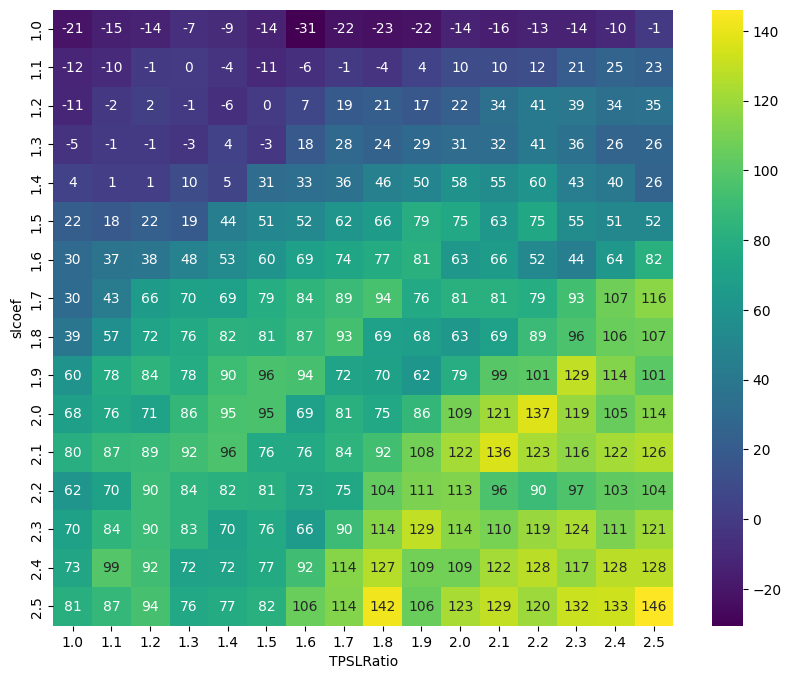

In [64]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Convert multiindex series to dataframe
heatmap_df = heatmap.unstack()
plt.figure(figsize=(10, 8))
sns.heatmap(heatmap_df, annot=True, cmap='viridis', fmt='.0f')
plt.show()

In [65]:
from backtesting import Strategy
from backtesting import Backtest

dftest = df[:]
def SIGNAL():
    return dftest.TotalSignal

class MyStrat(Strategy):
    mysize = 3000
    slcoef = 2.6
    TPSLRatio = 2.6
    
    def init(self):
        super().init()
        self.signal1 = self.I(SIGNAL)

    def next(self):
        super().next()
        slatr = self.slcoef*self.data.ATR[-1]
        TPSLRatio = self.TPSLRatio
       
        if self.signal1==1 and len(self.trades)==0:
            sl1 = self.data.Close[-1] - slatr
            tp1 = self.data.Close[-1] + slatr*TPSLRatio
            self.buy(sl=sl1, tp=tp1, size=self.mysize)
        
        elif self.signal1==2 and len(self.trades)==0:         
            sl1 = self.data.Close[-1] + slatr
            tp1 = self.data.Close[-1] - slatr*TPSLRatio
            self.sell(sl=sl1, tp=tp1, size=self.mysize)

bt = Backtest(dftest, MyStrat, cash=250, margin=1/30, commission=0.0002)
bt.run()

C:\Users\Public\Documents\Wondershare\CreatorTemp\ipykernel_11472\484706715.py:32: UserWarning:

Data index is not datetime. Assuming simple periods, but `pd.DateTimeIndex` is advised.



Start                                     0.0
End                                   18175.0
Duration                              18175.0
Exposure Time [%]                   55.413732
Equity Final [$]                   518.742166
Equity Peak [$]                     595.79414
Return [%]                         107.496866
Buy & Hold Return [%]               -0.787264
Return (Ann.) [%]                         0.0
Volatility (Ann.) [%]                     NaN
Sharpe Ratio                              NaN
Sortino Ratio                             NaN
Calmar Ratio                              0.0
Max. Drawdown [%]                  -15.962946
Avg. Drawdown [%]                   -1.633477
Max. Drawdown Duration                 3616.0
Avg. Drawdown Duration             119.251701
# Trades                                171.0
Win Rate [%]                        35.672515
Best Trade [%]                       1.470335
Worst Trade [%]                     -0.778732
Avg. Trade [%]                    

In [66]:
bt.plot()

f:\Python\Lib\site-packages\backtesting\_plotting.py:659: UserWarning:

found multiple competing values for 'toolbar.active_drag' property; using the latest value

f:\Python\Lib\site-packages\backtesting\_plotting.py:659: UserWarning:

found multiple competing values for 'toolbar.active_scroll' property; using the latest value



GridPlot(id='p1638', ...)

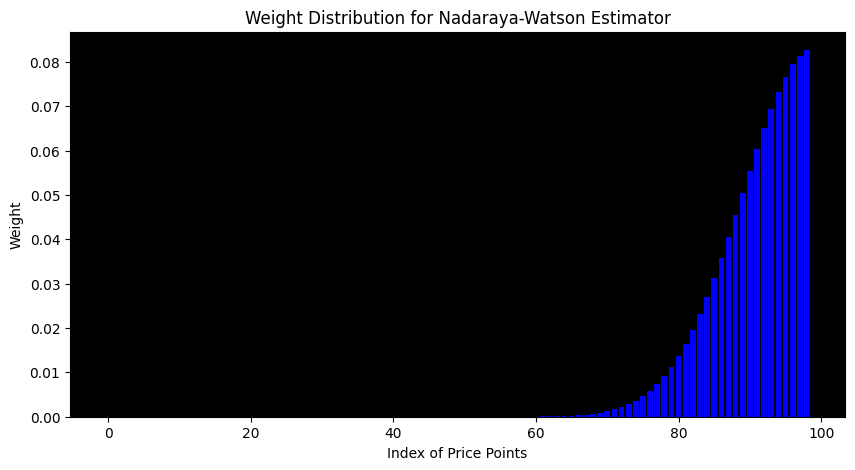

In [20]:
import numpy as np
import matplotlib.pyplot as plt

def gaussian_kernel(x, bandwidth):
    return (1 / (np.sqrt(2 * np.pi) * bandwidth)) * np.exp(-0.5 * ((x / bandwidth) ** 2))

def compute_weights(X, x, bandwidth):
    weights = [gaussian_kernel(x - i, bandwidth) for i in X]
    weights /= np.sum(weights) # Normalize to make the weights sum to 1
    return weights

# Generate synthetic price data
np.random.seed(0)
prices = np.array([2 for i in range(0, 100)])  # 100 price points

# Select the current price point (most recent)
current_price_index = 99  # Last price in the series
current_price = prices[current_price_index]

# Bandwidth (standard deviation of the kernel)
bandwidth = 10

# Compute weights for all preceding points
weights = compute_weights(range(0, 99), current_price_index, bandwidth)

# Plot the weights distribution
plt.figure(figsize=(10, 5))
plt.bar(range(current_price_index), weights, color='blue')
plt.title('Weight Distribution for Nadaraya-Watson Estimator')
plt.xlabel('Index of Price Points')
plt.ylabel('Weight')
plt.grid(False)
plt.gca().set_facecolor('black') # Change background color of the plot to black
plt.show()